In [1]:
!nvidia-smi

Sat Apr  6 07:33:31 2024       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.116.04   Driver Version: 525.116.04   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Quadro RTX 5000     Off  | 00000000:00:05.0 Off |                  Off |
| 33%   24C    P8     9W / 230W |      1MiB / 16384MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Roberta Base Model

In [2]:
import os
import pandas as pd
import numpy as np

import torch
from torch.utils.data import Dataset, DataLoader, random_split

from transformers import AutoTokenizer, AutoModel

In [3]:
# setting the model name
PRE_TRAINED_MODEL_NAME = 'roberta-base'

# setting the dataset
dataset='MBTI 500 multi_label.csv'


# setting the data path
if os.path.exists(f'/datasets/mbti/{dataset}'):
    DATAPATH=f'/datasets/mbti/{dataset}'
else:
    DATAPATH=f'../data/{dataset}'

# setting the checkpoint path 
if os.path.exists('ckpts'):
    CHECKPOINTPATH = 'ckpts/Persnality_MBTI'
else:
    CHECKPOINTPATH = '../ckpts/Persnality_MBTI'

# training parameters
MAX_LEN = 512
TRAIN_BATCH_SIZE = 20
VALID_BATCH_SIZE = 16
TEST_BATCH_SIZE = 16
EPOCHS = 10
THRESHOLD = 0.5 # threshold for the sigmoid function

# TOKENIZER
tokenizer = AutoTokenizer.from_pretrained(PRE_TRAINED_MODEL_NAME)

# setting the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# setting the random seed
torch.manual_seed(99)
torch.cuda.manual_seed(99)
torch.cuda.manual_seed_all(99)
np.random.seed(99)

tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/481 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

In [4]:
DATAPATH,CHECKPOINTPATH

('/datasets/mbti/MBTI 500 multi_label.csv', 'ckpts/Persnality_MBTI')

### Loading the Data

In [5]:
# load the data
data = pd.read_csv(DATAPATH,encoding='utf-8')

In [6]:
# delete the words in the words list from the posts column
words=[" intj"," intp"," entj"," entp"," infj"," infp"," enfj"," enfp"," istj"," isfj"," estj"," esfj"," istp"," isfp"," estp"," esfp", " introvert", " extrovert", " intuitive", " observant", " thinking", " feeling", " judging", " preceiving"]

sample_data= data[1000:1500]
# count the words in the posts column for the sample data and

def count_occurences(data, words):
    counts = dict()
    for word in words:
        counts[word] = data['posts'].str.count(word).sum()
    return counts

counts = count_occurences(sample_data, words)
counts

{' intj': 1623,
 ' intp': 281,
 ' entj': 124,
 ' entp': 131,
 ' infj': 255,
 ' infp': 148,
 ' enfj': 64,
 ' enfp': 213,
 ' istj': 108,
 ' isfj': 48,
 ' estj': 42,
 ' esfj': 61,
 ' istp': 54,
 ' isfp': 51,
 ' estp': 50,
 ' esfp': 70,
 ' introvert': 273,
 ' extrovert': 141,
 ' intuitive': 55,
 ' observant': 6,
 ' thinking': 0,
 ' feeling': 0,
 ' judging': 0,
 ' preceiving': 0}

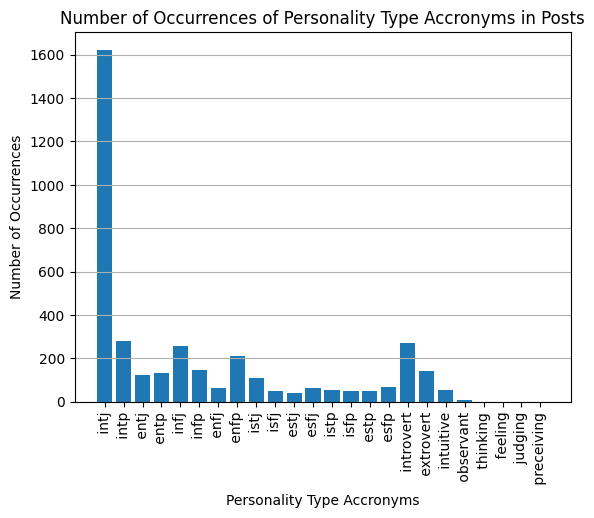

In [7]:
# graph the counts
import matplotlib.pyplot as plt

plt.bar(counts.keys(), counts.values())
plt.ylabel('Number of Occurrences')
plt.xlabel('Personality Type Accronyms')
plt.title('Number of Occurrences of Personality Type Accronyms in Posts')
plt.grid(axis='y')
plt.xticks(rotation=90)
plt.show()

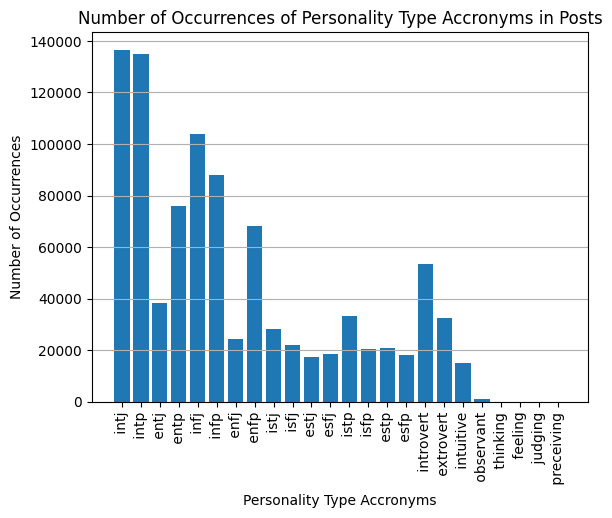

In [8]:
counts = count_occurences(data, words)
# graph the counts
import matplotlib.pyplot as plt

plt.bar(counts.keys(), counts.values())
plt.ylabel('Number of Occurrences')
plt.xlabel('Personality Type Accronyms')
plt.title('Number of Occurrences of Personality Type Accronyms in Posts')
plt.grid(axis='y')
plt.xticks(rotation=90)
plt.show()

In [9]:
# get the labels list
labels_list = data.columns[2:].tolist()
print(f'Labels list: {labels_list}')

Labels list: ['IE', 'NS', 'TF', 'JP']


#### Load the model

In [10]:
# import model
import sys
sys.path.append('../Models')
import MBTI_model_shap as model


In [11]:
# first model
model_words = model.ROBERTAClass(PRE_TRAINED_MODEL_NAME)
model_words.load_state_dict(torch.load(CHECKPOINTPATH + f'_Best_{PRE_TRAINED_MODEL_NAME}.bin', map_location=torch.device(device)))
model_words.to(device)
print(f'{PRE_TRAINED_MODEL_NAME} loaded')
model_words.eval()

# second model
model_no_words = model.ROBERTAClass(PRE_TRAINED_MODEL_NAME)
model_no_words.load_state_dict(torch.load(CHECKPOINTPATH + f'_clean_Best_{PRE_TRAINED_MODEL_NAME}.bin', map_location=torch.device(device)))
model_no_words.to(device)
print(f'{PRE_TRAINED_MODEL_NAME}_no_words loaded')
model_no_words.eval()


torch.set_grad_enabled(False)

model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of RobertaModel were not initialized from the model checkpoint at roberta-base and are newly initialized: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


roberta-base loaded
roberta-base_no_words loaded


### SHAP

In [12]:
import shap
shap.initjs()

In [13]:
# check if need to load or calculate the shap values
calculate_shap=True
if os.path.exists('../shap_values') or os.path.exists('shap_values_NS.pkl'):
    calculate_shap=False

In [14]:
calculate_shap

False

In [15]:
import pickle
# save the shap values function
def save_shap_values(shap_values, filename):
    with open(filename, 'wb') as f:
        pickle.dump(shap_values, f)
        
# load the shap values function
def load_shap_values(filename):
    with open(filename, 'rb') as f:
        shap_values = pickle.load(f)
    return shap_values        
        

### Calculate or load the SHAP values

In [16]:
if calculate_shap:
    shap_values_IE=model.explain_model(model_words, sample_data["posts"], 'IE')
    shap_values_NS=model.explain_model(model_words, sample_data["posts"], 'NS')
    shap_values_TF=model.explain_model(model_words, sample_data["posts"], 'TF')
    shap_values_JP=model.explain_model(model_words, sample_data["posts"], 'JP')
else:
    shap_values_IE=load_shap_values('shap_values_IE.pkl')
    shap_values_NS=load_shap_values('shap_values_NS.pkl')
    shap_values_TF=load_shap_values('shap_values_TF.pkl')
    shap_values_JP=load_shap_values('shap_values_JP.pkl')
        

In [17]:
if calculate_shap:
    shap_values_IE_no_words=model.explain_model(model_no_words, sample_data["posts"], 'IE')
    shap_values_NS_no_words=model.explain_model(model_no_words, sample_data["posts"], 'NS')
    shap_values_TF_no_words=model.explain_model(model_no_words, sample_data["posts"], 'TF')
    shap_values_JP_no_words=model.explain_model(model_no_words, sample_data["posts"], 'JP')
else:
    shap_values_IE_no_words=load_shap_values('shap_values_IE_no_words.pkl')
    shap_values_NS_no_words=load_shap_values('shap_values_NS_no_words.pkl')
    shap_values_TF_no_words=load_shap_values('shap_values_TF_no_words.pkl')
    shap_values_JP_no_words=load_shap_values('shap_values_JP_no_words.pkl')  

### Save shap values

In [18]:
if calculate_shap:
    save_shap_values(shap_values_IE, 'shap_values_IE.pkl')
    save_shap_values(shap_values_NS, 'shap_values_NS.pkl')
    save_shap_values(shap_values_TF, 'shap_values_TF.pkl')
    save_shap_values(shap_values_JP, 'shap_values_JP.pkl')

    save_shap_values(shap_values_IE_no_words, 'shap_values_IE_no_words.pkl')
    save_shap_values(shap_values_NS_no_words, 'shap_values_NS_no_words.pkl')
    save_shap_values(shap_values_TF_no_words, 'shap_values_TF_no_words.pkl')
    save_shap_values(shap_values_JP_no_words, 'shap_values_JP_no_words.pkl')

### Plot the shap values

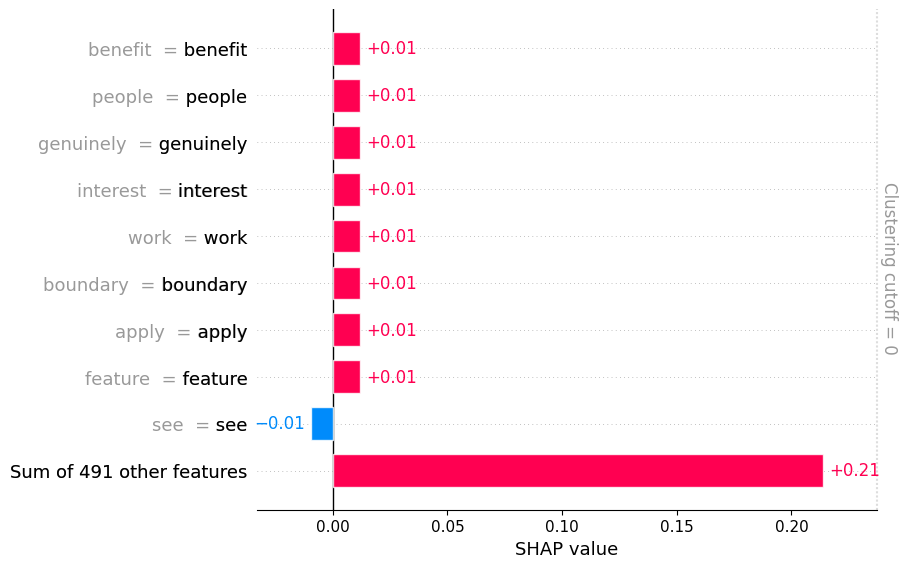

In [77]:
shap.plots.bar(shap_values_JP_no_words[0,:,0], clustering_cutoff=0)

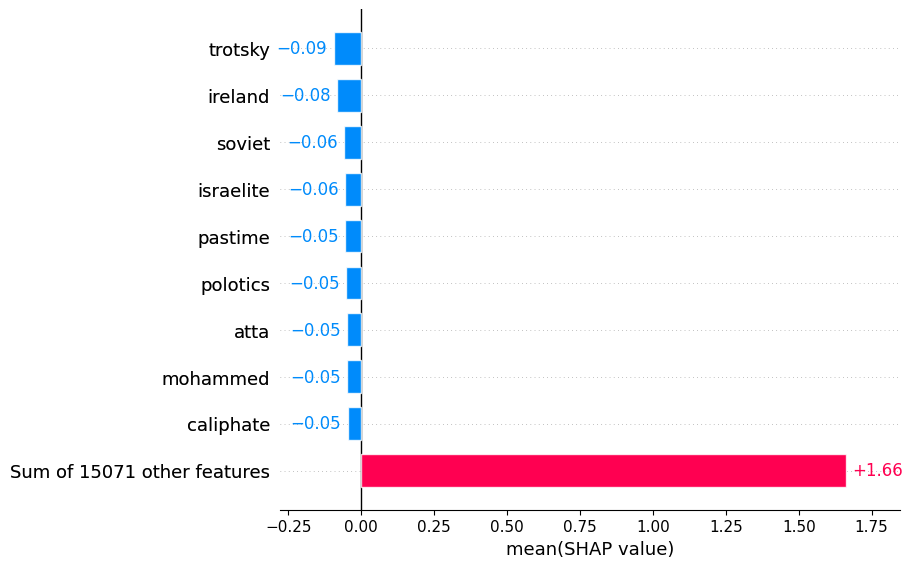

In [83]:
shap.plots.bar(shap_values_NS_no_words[:, :, 0].mean(0), clustering_cutoff=2)

In [22]:
shap_values_IE

.values =
array([array([[ 1.00468716e-03, -1.00468728e-03],
              [ 1.00468716e-03, -1.00468728e-03],
              [ 1.00468716e-03, -1.00468728e-03],
              [ 1.00468716e-03, -1.00468728e-03],
              [ 1.72709464e-04, -1.72709724e-04],
              [ 1.72709464e-04, -1.72709724e-04],
              [ 1.72709464e-04, -1.72709724e-04],
              [ 1.72709464e-04, -1.72709724e-04],
              [-1.93517189e-04,  1.93516915e-04],
              [-1.93517189e-04,  1.93516915e-04],
              [-1.93517189e-04,  1.93516915e-04],
              [-1.93517189e-04,  1.93516915e-04],
              [-1.93517189e-04,  1.93516915e-04],
              [-1.93517189e-04,  1.93516915e-04],
              [-1.93517189e-04,  1.93516915e-04],
              [-1.93517189e-04,  1.93516915e-04],
              [ 4.31908760e-04, -4.31909049e-04],
              [ 4.31908760e-04, -4.31909049e-04],
              [ 4.31908760e-04, -4.31909049e-04],
              [ 4.31908760e-04, -4.31909

In [20]:
shap.plots.text(shap_values_IE[5])